In [396]:
# from gerador5 import pipeline_completo

In [397]:
import pandas as pd
import seaborn as sns

In [398]:
dados2 = pd.read_csv('../data/flights4.csv')

In [399]:
dados = pd.read_csv('../data/flights5.csv')

In [400]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,actual_arrival_time,actual_departure_time
0,8,KY,Embraer E175,schengen,IGC,18.191515,20.191515,0,2010,False,18.099269,20.099269
1,12,KY,Embraer E175,schengen,JQJ,6.540910,9.540910,0,2010,False,6.236687,9.236687
2,4,CX,Boeing 737,schengen,UXH,9.014826,11.014826,0,2010,False,9.696471,11.696471
3,21,KY,Boeing 787,schengen,DFL,11.997474,14.997474,0,2010,False,11.759739,14.759739
4,24,CX,Boeing 737,schengen,UXH,10.131052,13.131052,0,2010,False,11.522277,14.522277
...,...,...,...,...,...,...,...,...,...,...,...,...
71170,12,KY,Embraer E175,schengen,JQJ,6.540910,9.540910,364,2022,False,6.512017,9.512017
71171,4,CX,Boeing 737,schengen,UXH,9.014826,11.014826,364,2022,False,9.928076,11.928076
71172,18,KY,Airbus A320,schengen,JKQ,9.319352,11.319352,364,2022,False,9.752513,11.752513
71173,12,KY,Embraer E175,schengen,JQJ,6.540910,9.540910,364,2022,False,6.388302,9.388302


In [401]:
dados.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 71175 entries, 0 to 71174
Data columns (total 12 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   flight_id              71175 non-null  int64  
 1   airline                71175 non-null  object 
 2   aircraft_type          71175 non-null  object 
 3   schengen               71175 non-null  object 
 4   origin                 71175 non-null  object 
 5   arrival_time           71175 non-null  float64
 6   departure_time         71175 non-null  float64
 7   day                    71175 non-null  int64  
 8   year                   71175 non-null  int64  
 9   is_holiday             71175 non-null  bool   
 10  actual_arrival_time    71175 non-null  float64
 11  actual_departure_time  71175 non-null  float64
dtypes: bool(1), float64(4), int64(3), object(4)
memory usage: 6.0+ MB


In [402]:
#calculate the delay
dados['delay'] = (dados['actual_arrival_time'] - dados['arrival_time']) * 60

In [403]:
dados['delay']

0        -5.534783
1       -18.253380
2        40.898697
3       -14.264074
4        83.473498
           ...    
71170    -1.733611
71171    54.795016
71172    25.989679
71173    -9.156469
71174    36.103061
Name: delay, Length: 71175, dtype: float64

In [404]:
from datetime import datetime, timedelta

In [405]:
def convert_day_to_date(day, year):
    base_date = datetime(year=year, month=1, day=1)
    target_date = base_date + timedelta(days=day)
    return target_date.strftime('%Y-%m-%d')  # Format the date as desired

# Convert 'day' column to regular dates
dados['date'] = dados.apply(lambda row: convert_day_to_date(row['day'], row['year']), axis=1)

In [406]:
dados

,flight_id,airline,aircraft_type,schengen,origin,arrival_time,departure_time,day,year,is_holiday,actual_arrival_time,actual_departure_time,delay,date
0,8,KY,Embraer E175,schengen,IGC,18.191515,20.191515,0,2010,False,18.099269,20.099269,-5.534783,2010-01-01
1,12,KY,Embraer E175,schengen,JQJ,6.540910,9.540910,0,2010,False,6.236687,9.236687,-18.253380,2010-01-01
2,4,CX,Boeing 737,schengen,UXH,9.014826,11.014826,0,2010,False,9.696471,11.696471,40.898697,2010-01-01
3,21,KY,Boeing 787,schengen,DFL,11.997474,14.997474,0,2010,False,11.759739,14.759739,-14.264074,2010-01-01
4,24,CX,Boeing 737,schengen,UXH,10.131052,13.131052,0,2010,False,11.522277,14.522277,83.473498,2010-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71170,12,KY,Embraer E175,schengen,JQJ,6.540910,9.540910,364,2022,False,6.512017,9.512017,-1.733611,2022-12-31
71171,4,CX,Boeing 737,schengen,UXH,9.014826,11.014826,364,2022,False,9.928076,11.928076,54.795016,2022-12-31
71172,18,KY,Airbus A320,schengen,JKQ,9.319352,11.319352,364,2022,False,9.752513,11.752513,25.989679,2022-12-31
71173,12,KY,Embraer E175,schengen,JQJ,6.540910,9.540910,364,2022,False,6.388302,9.388302,-9.156469,2022-12-31


In [407]:
import plotly.express as px

In [408]:
px.line(dados[dados['year']==2018], x = 'date', y = 'delay', color = 'airline')

In [437]:
#compare two histograms from dados and dados2
fig = px.histogram(dados2, x = 'delay', histnorm = 'probability density', nbins = 100, opacity = 0.5, color_discrete_sequence = ['red'], title = 'Dados')
fig.add_vline(x = dados2['delay'].mean(), line_width = 3, line_dash = 'dash', line_color = 'black')
fig.add_vline(x = dados2['delay'].median(), line_width = 3, line_dash = 'dash', line_color = 'green')
fig.add_vline(x = dados2['delay'].mode()[0], line_width = 3, line_dash = 'dash', line_color = 'blue')
fig.show()

In [436]:
#compare two histograms from dados and dados2
fig = px.histogram(dados, x = 'delay', histnorm = 'probability density', nbins = 100, opacity = 0.5, color_discrete_sequence = ['red'], title = 'Dados')
fig.add_vline(x = dados['delay'].mean(), line_width = 3, line_dash = 'dash', line_color = 'black')
fig.add_vline(x = dados['delay'].median(), line_width = 3, line_dash = 'dash', line_color = 'green')
fig.add_vline(x = dados['delay'].mode()[0], line_width = 3, line_dash = 'dash', line_color = 'blue')
fig.show()

In [410]:
px.histogram(dados, x = 'delay', color = 'airline')

In [411]:
px.histogram(dados, x = 'delay', color = 'aircraft_type')

In [412]:
px.histogram(dados, x = 'delay', color = 'origin')

In [413]:
px.histogram(dados, x = 'delay', color = 'schengen')

In [414]:
dados['airline'].value_counts()

airline
KY    42704
CX    23680
FR     4791
Name: count, dtype: int64

In [415]:
dados2.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320    14.619329
Airbus A330    18.453126
Boeing 737     18.105591
Boeing 777     28.754074
Boeing 787      6.050397
Name: delay, dtype: float64

In [416]:
dados2.groupby('origin')['delay'].mean()

origin
BYU    12.671492
ESB    38.448019
GXN     9.075506
JRT    24.759992
LZW     2.374455
NBI    21.873546
NNN    23.106483
PWR    -2.486139
YKZ    11.725588
YOG    -2.088816
Name: delay, dtype: float64

In [417]:
dados.groupby('origin')['delay'].mean()

origin
DFL    11.488302
GUH    14.322543
IGC    29.921443
ILX    14.042999
JKQ    22.120035
JQJ   -17.546980
KCI     3.886418
UXH    42.262696
VPG    28.559132
Name: delay, dtype: float64

In [418]:
dados.groupby('aircraft_type')['delay'].mean()

aircraft_type
Airbus A320     35.051907
Airbus A330      3.948724
Boeing 737      38.404057
Boeing 777       7.896664
Boeing 787       2.201540
Embraer E175    -6.604272
Name: delay, dtype: float64

In [419]:
dados.groupby('airline')['delay'].mean()

airline
CX    46.785078
FR     5.284398
KY     3.466955
Name: delay, dtype: float64

In [420]:
# sns.countplot(dados['airline'])

In [421]:
dados['aircraft_type'].value_counts()

aircraft_type
Boeing 737      16579
Airbus A320     16502
Boeing 787      11936
Embraer E175     9552
Boeing 777       9460
Airbus A330      7146
Name: count, dtype: int64

In [422]:
# sns.countplot(dados['aircraft_type'])

In [423]:
dados['origin'].value_counts()

origin
JKQ    16509
VPG     9525
GUH     9419
KCI     7155
IGC     7073
DFL     7068
UXH     4866
JQJ     4793
ILX     4767
Name: count, dtype: int64

In [424]:
# sns.countplot(dados['origin'])

In [425]:
dados['schengen'].value_counts(normalize= True)

schengen
schengen        0.766575
non-schengen    0.233425
Name: proportion, dtype: float64

In [426]:
# sns.countplot(dados['schengen'])

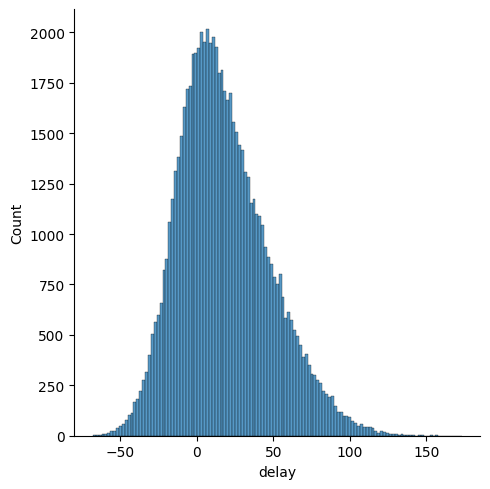

In [427]:
sns.displot(dados['delay'])

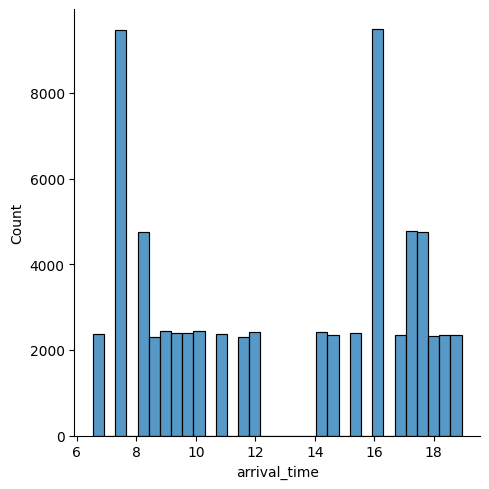

In [428]:
sns.displot(dados['arrival_time'])

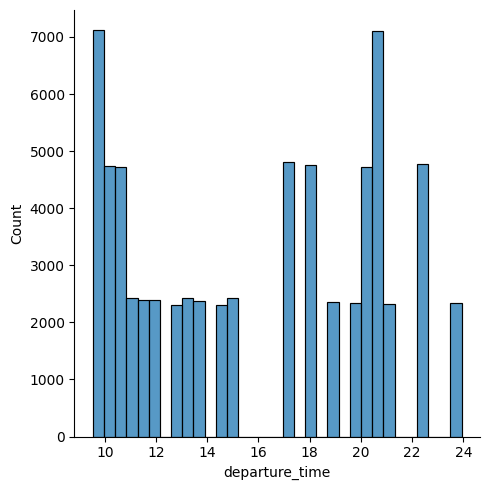

In [429]:
sns.displot(dados['departure_time'])

<Axes: >

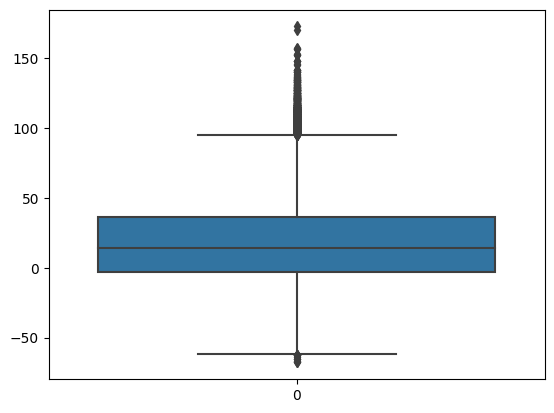

In [430]:
sns.boxplot(dados['delay'])